### imports

In [1]:
# Commons
import os
import pandas as pd
import numpy as np
import random

# Visualization
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from zlib import crc32
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

# Metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.metrics import mean_squared_error

# Models
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer

# Ensamble model
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.ensemble import StackingRegressor

# Exporting
from sklearn2pmml.pipeline import PMMLPipeline
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn2pmml import sklearn2pmml


### 1. Fetch data

In [2]:
"""
Fetch .csv data from directories.
"""

csv_path = os.path.join('data')
all_files = os.listdir(csv_path)
csv_files = [f for f in all_files if f.count('rent') == 1 and f.count('.csv') == 1] # if you want rent-apartments, set 1 instad 0
df_list = []

for csv in csv_files:
    file_path = os.path.join(csv_path, csv)
    try:
        # Try reading the file using default UTF-8 encoding
        df = pd.read_csv(file_path)
        df_list.append(df)
    except Exception as e:
        print(f"Could not read file {csv}, error: {e}")

data = pd.concat(df_list, ignore_index=True)

print(f"Samples amount: {len(data)}")
data.head()

Samples amount: 44593


,id,city,type,squareMeters,rooms,floor,floorCount,buildYear,latitude,longitude,...,pharmacyDistance,ownership,buildingMaterial,condition,hasParkingSpace,hasBalcony,hasElevator,hasSecurity,hasStorageRoom,price
0,2a1a6db97ff122d6bc148abb6f0e498a,szczecin,blockOfFlats,52.0,2.0,3.0,3.0,2008.0,53.460535,14.545416,...,0.307,condominium,brick,NaN,yes,yes,no,no,no,3500
1,368e16142922433c709e6921a3b8f2a8,szczecin,blockOfFlats,70.0,3.0,7.0,11.0,1985.0,53.378485,14.657089,...,0.086,condominium,concreteSlab,premium,no,yes,yes,no,no,2900
2,655acd54eb518a718fd1f59fd7161c61,szczecin,blockOfFlats,43.0,2.0,3.0,3.0,1960.0,53.425946,14.559489,...,0.338,condominium,concreteSlab,premium,no,yes,no,no,yes,2900
3,99f85bbc55d110aa5a79ad4c7d5a0562,szczecin,blockOfFlats,46.7,2.0,1.0,4.0,1980.0,53.446990,14.556851,...,0.096,condominium,concreteSlab,premium,no,no,no,no,yes,2400
4,601b83a79fb6b89fe8e488bfcdd5e872,szczecin,NaN,56.2,3.0,1.0,4.0,NaN,53.441100,14.549100,...,0.050,condominium,NaN,NaN,no,no,NaN,no,no,3000


### 2. Data cleaning

In [3]:
"""
Check data type.
"""

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44593 entries, 0 to 44592
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    44593 non-null  object 
 1   city                  44593 non-null  object 
 2   type                  34222 non-null  object 
 3   squareMeters          44593 non-null  float64
 4   rooms                 44593 non-null  float64
 5   floor                 39099 non-null  float64
 6   floorCount            43750 non-null  float64
 7   buildYear             32487 non-null  float64
 8   latitude              44593 non-null  float64
 9   longitude             44593 non-null  float64
 10  centreDistance        44593 non-null  float64
 11  poiCount              44593 non-null  float64
 12  schoolDistance        44585 non-null  float64
 13  clinicDistance        44565 non-null  float64
 14  postOfficeDistance    44579 non-null  float64
 15  kindergartenDistanc

In [4]:
"""
Clean NaN and duplicates. Drop columns with lack of data.
"""

dropped_columns = ['id','type', 'floor', 'buildYear', 'condition', 'buildingMaterial']
data.drop(dropped_columns, axis=1, inplace=True)
data.dropna(inplace=True)
data = data.drop_duplicates().reset_index(drop=True)

In [5]:
"""
Check number of null values.
"""

print(f"Dataset amount: {len(data)}")
data.isna().sum()

Dataset amount: 28591


city                    0
squareMeters            0
rooms                   0
floorCount              0
latitude                0
longitude               0
centreDistance          0
poiCount                0
schoolDistance          0
clinicDistance          0
postOfficeDistance      0
kindergartenDistance    0
restaurantDistance      0
collegeDistance         0
pharmacyDistance        0
ownership               0
hasParkingSpace         0
hasBalcony              0
hasElevator             0
hasSecurity             0
hasStorageRoom          0
price                   0
dtype: int64

### 3. Analize cleared data

In [6]:
"""
Statistics.
"""

data.describe()

,squareMeters,rooms,floorCount,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,kindergartenDistance,restaurantDistance,collegeDistance,pharmacyDistance,price
count,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000,28591.000000
mean,53.714725,2.337134,5.828512,51.748924,19.720362,3.924504,24.295932,0.361994,0.756160,0.460126,0.309765,0.250484,1.317656,0.298300,3737.554055
std,21.237002,0.831468,3.476701,1.174305,1.655188,2.567023,25.798160,0.297491,0.690172,0.338464,0.267138,0.265186,1.021267,0.273841,2183.857675
min,25.000000,1.000000,1.000000,49.987495,14.477400,0.020000,0.000000,0.002000,0.001000,0.001000,0.001000,0.001000,0.004000,0.001000,780.000000
25%,39.750000,2.000000,4.000000,51.063957,18.656200,1.850000,9.000000,0.177000,0.296000,0.237000,0.150000,0.089000,0.545000,0.137000,2500.000000
50%,49.000000,2.000000,5.000000,52.184600,19.964942,3.520000,17.000000,0.287000,0.547000,0.391000,0.254000,0.182000,1.011000,0.232000,3000.000000
75%,61.780000,3.000000,7.000000,52.247325,21.004106,5.460000,29.000000,0.453000,0.955000,0.584000,0.390000,0.326000,1.856000,0.382000,4200.000000
max,150.000000,6.000000,30.000000,54.571000,23.199087,16.610000,210.000000,4.027000,4.912000,4.128000,4.231000,4.210000,5.000000,4.158000,23000.000000


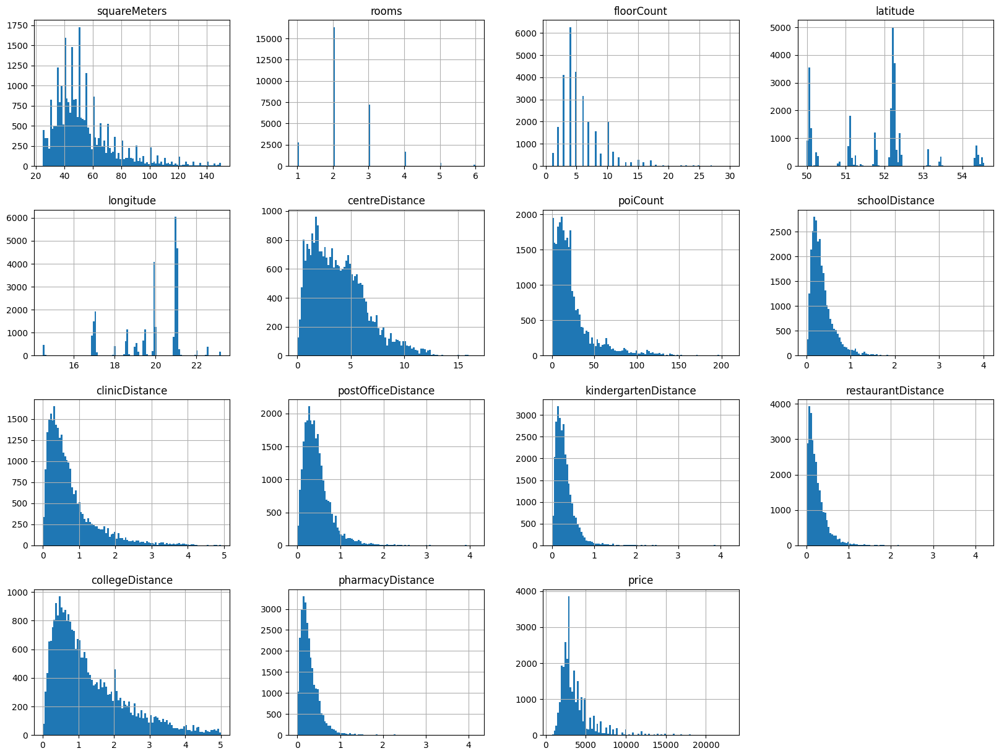

In [7]:
"""
Histograms.
"""

%matplotlib inline
data.hist(bins=100, figsize=(20,15))
plt.show()

In [8]:
"""
Locations on map.
This kind of map is loading quite long, but I think its worth it.
"""

locations = list(zip(data['latitude'], data['longitude']))
m = folium.Map(
    location=[np.mean(data['latitude']), np.mean(data['longitude'])],
    zoom_start=6
)
 
marker_cluster = MarkerCluster(locations=locations)
marker_cluster.add_to(m)
m

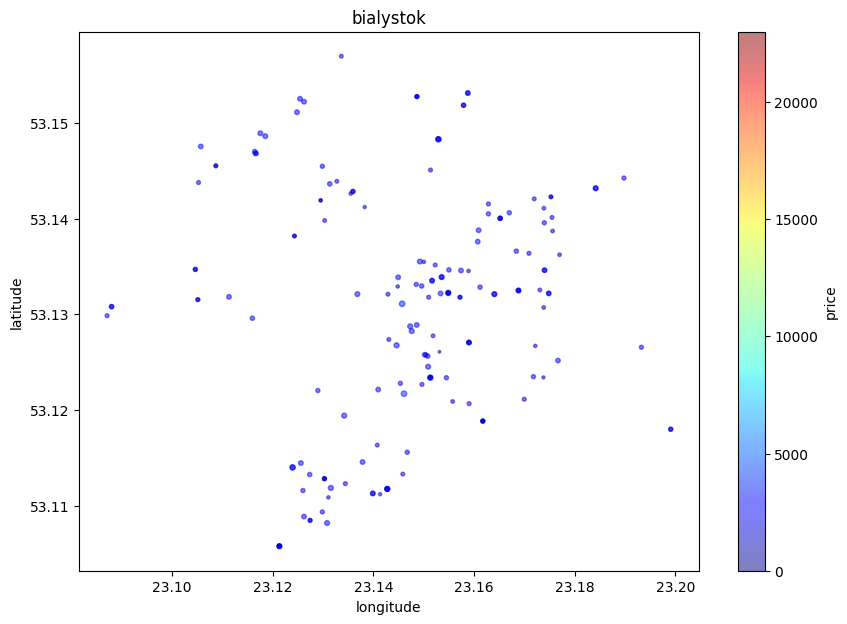

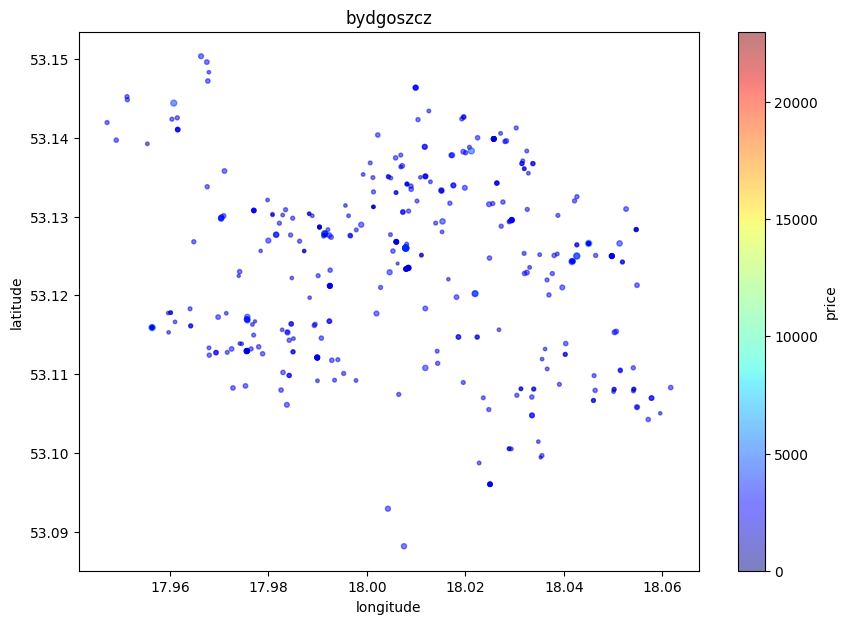

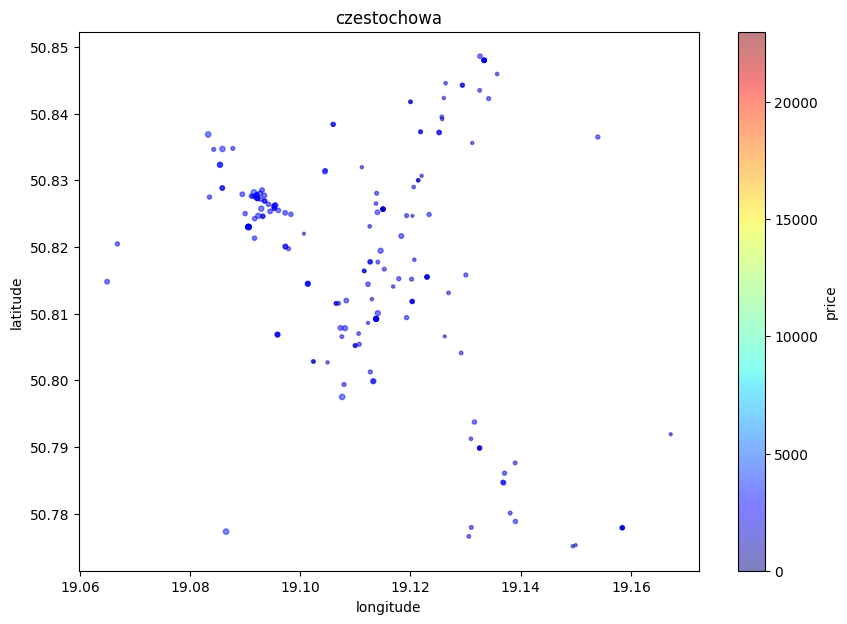

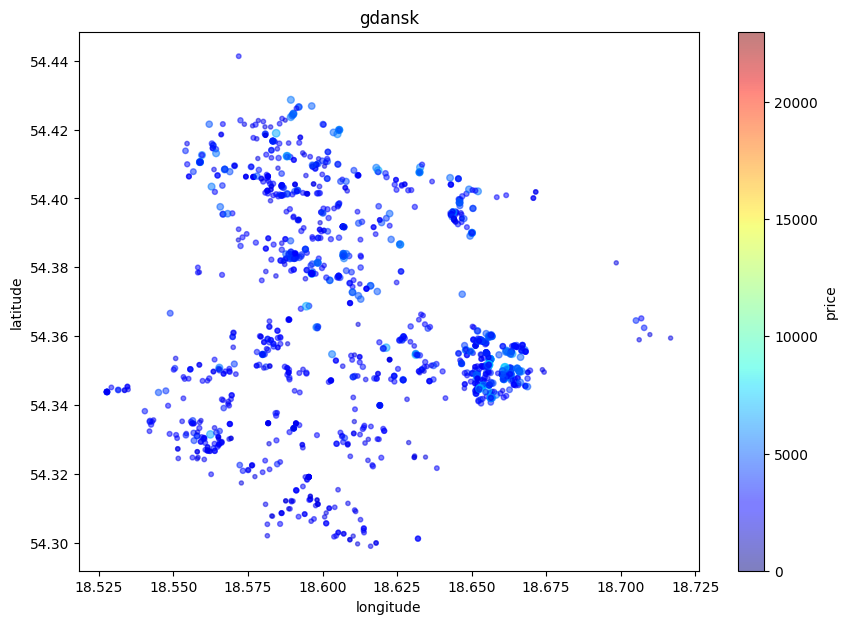

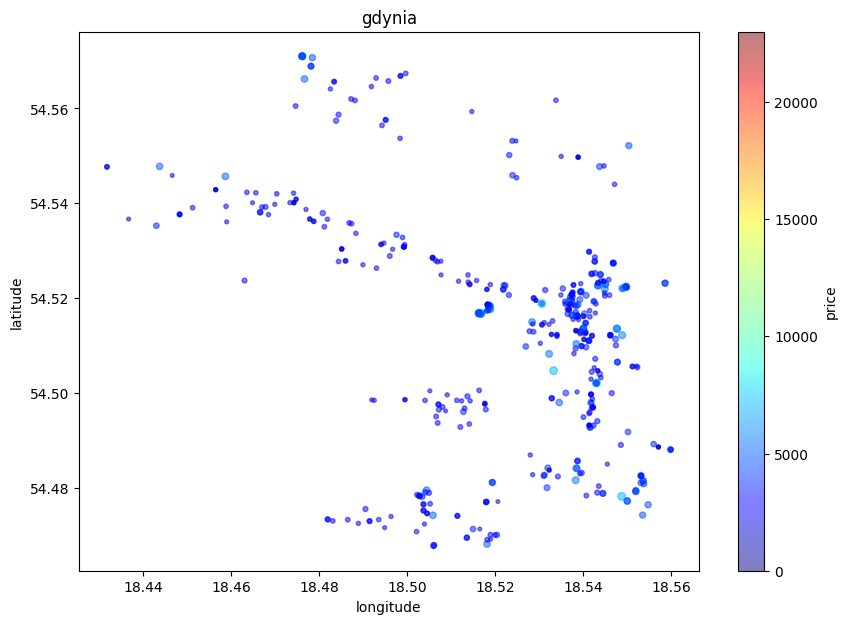

...

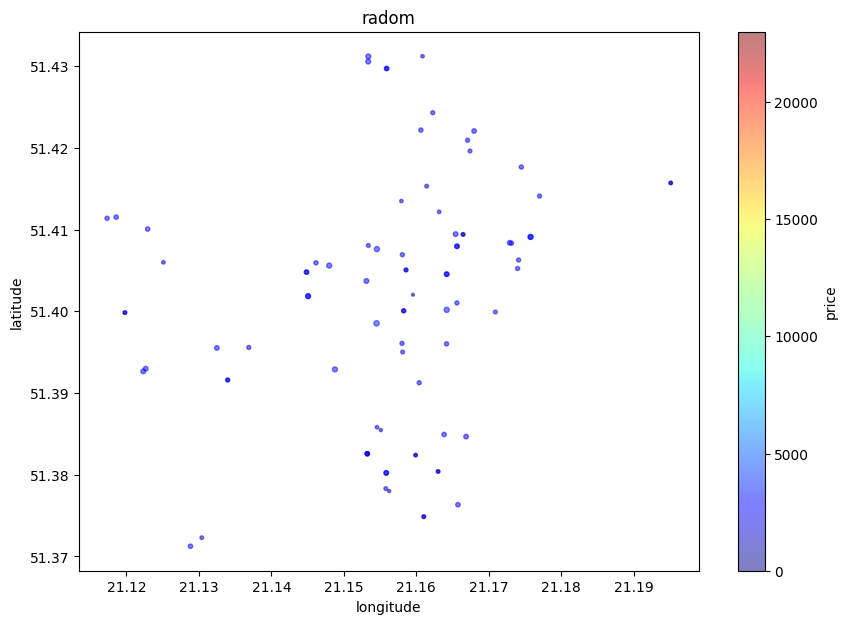

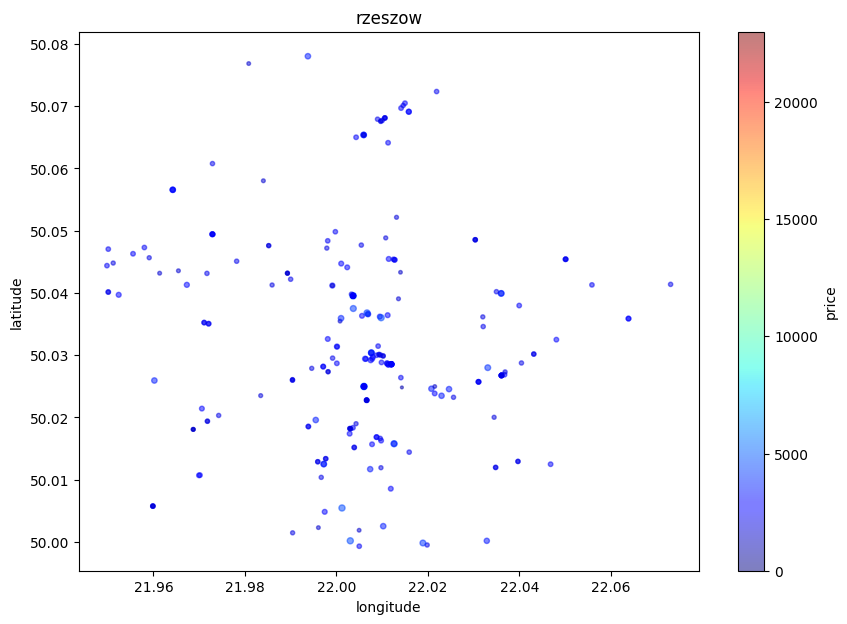

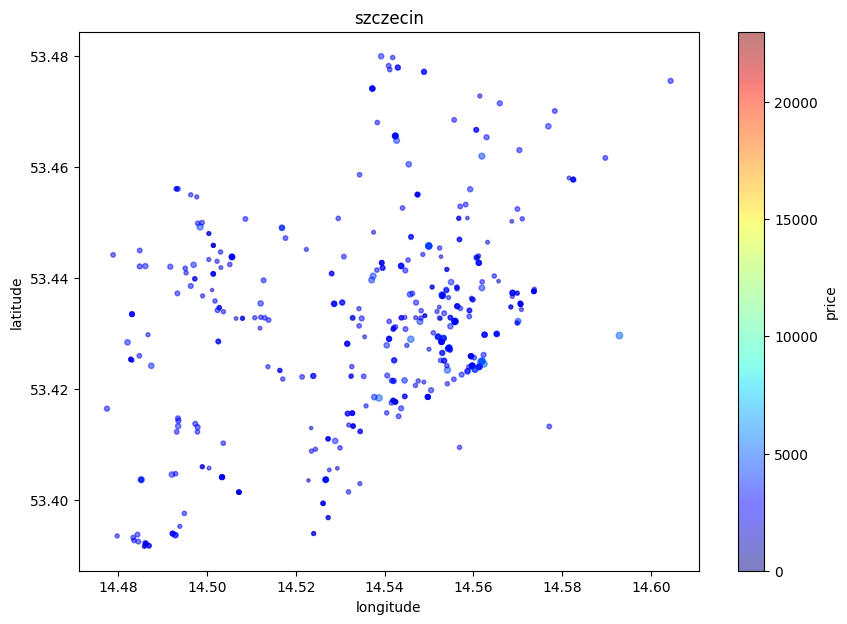

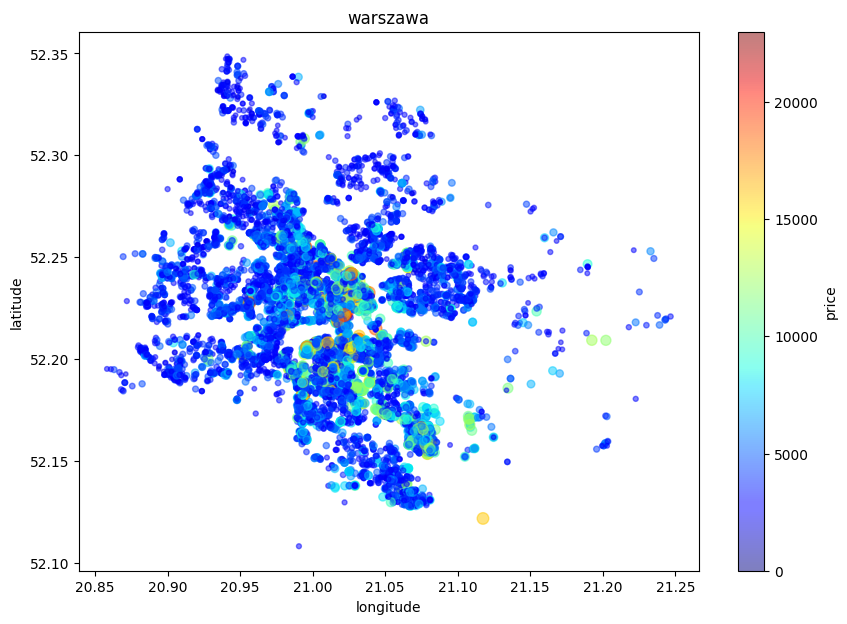

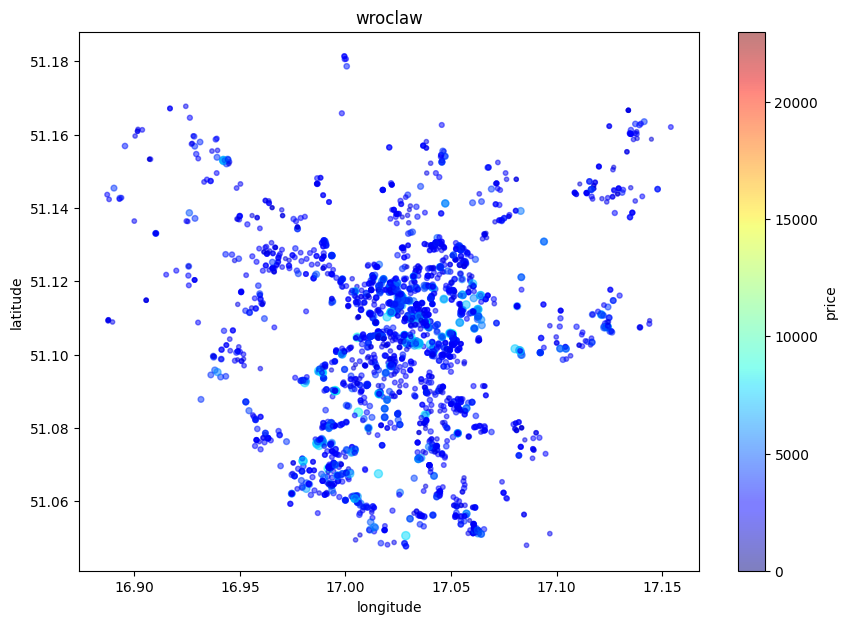

In [9]:
"""
Locations based on price.
"""

cities = np.unique(data['city'])
max_price = max(data['price'])
norm = Normalize(vmin=0, vmax=max_price)

for city in cities:
    subset = data[data['city'] == city]
    subset.plot(
        kind='scatter',
        x='longitude',
        y='latitude',
        title=city,
        alpha=0.5,
        s=100 * subset['price'] / max_price,
        figsize=(10, 7),
        c='price',
        norm=norm,
        cmap=plt.get_cmap('jet'),
        colorbar=True
    )

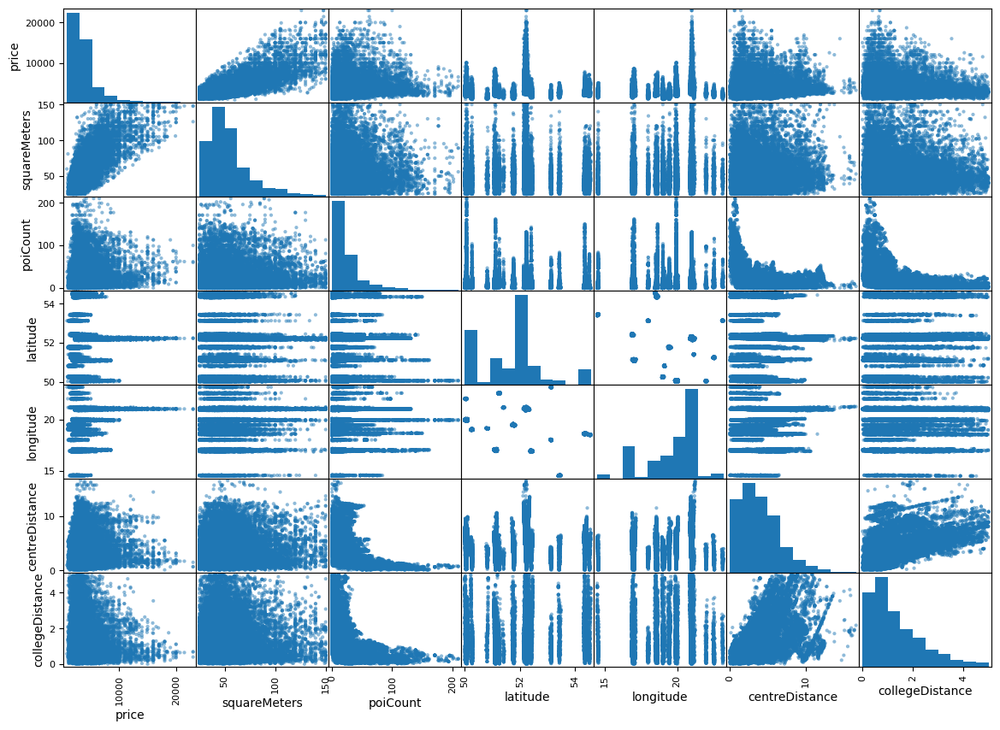

In [10]:
"""
Corelation matrix.
"""

%matplotlib inline
from pandas.plotting import scatter_matrix

attributes = ['price', 'squareMeters', 'poiCount', 'latitude', 'longitude', 'centreDistance', 'collegeDistance']
scatter_matrix(data[attributes], figsize=(14,10))
plt.show()

<AxesSubplot:>

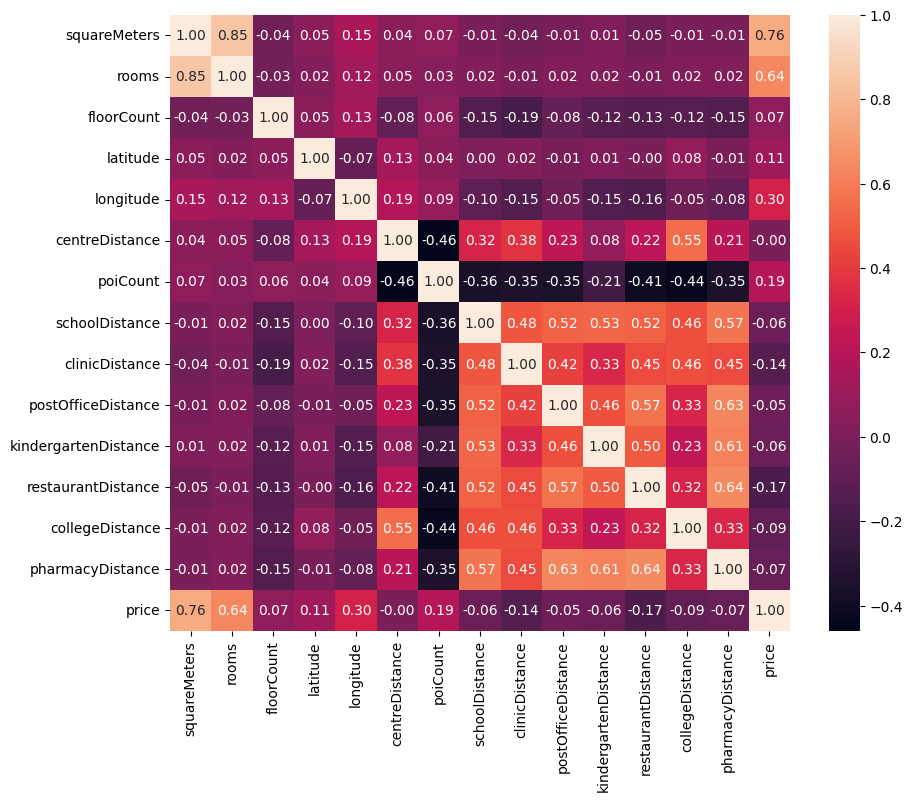

In [11]:
"""
Heatmap.
"""

plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(numeric_only=True), annot=True, fmt = '.2f')

### 4. Prepare data

In [12]:
"""
One-hot coding for cities.
"""

city_dummies = pd.get_dummies(data['city'])
data = data.drop('city', axis=1)
data = pd.concat([data, city_dummies], axis=1)

In [13]:
"""
Exclude non-numeric columns.
"""
numerical_columns = data.select_dtypes(include=['number']).columns
data = data[numerical_columns]

In [14]:
"""
Split data to X and y.
"""

test_ratio = 0.2 # 20% of amount is test data
y = data['price']
X = data.drop(columns=['price'])
rand_val = random.randint(0, 111)
min_y = min(y)
max_y = max(y)

In [15]:
"""
Choose interesting columns.
"""

"""
15 features
""" 
X_15f = X.copy()


"""
7 features
""" 
columns_7f = ['squareMeters', 'rooms', 'floorCount', 'latitude', 'longitude',
       'centreDistance', 'bialystok', 'bydgoszcz', 'czestochowa', 'gdansk',
       'gdynia', 'katowice', 'krakow', 'lodz', 'lublin', 'poznan', 'radom',
       'rzeszow', 'szczecin', 'warszawa', 'wroclaw']
X_7f = X[columns_7f].copy()


"""
4 features
""" 
columns_4f = ['squareMeters', 'latitude', 'longitude', 'bialystok', 'bydgoszcz',
       'czestochowa', 'gdansk', 'gdynia', 'katowice', 'krakow', 'lodz',
       'lublin', 'poznan', 'radom', 'rzeszow', 'szczecin', 'warszawa',
       'wroclaw']
X_4f = X[columns_4f].copy()



In [16]:
"""
Check columns and data example.
"""

X_15f.head()

,squareMeters,rooms,floorCount,latitude,longitude,centreDistance,poiCount,schoolDistance,clinicDistance,postOfficeDistance,...,katowice,krakow,lodz,lublin,poznan,radom,rzeszow,szczecin,warszawa,wroclaw
0,52.00,2.0,3.0,53.460535,14.545416,4.26,2.0,0.753,1.049,0.595,...,0,0,0,0,0,0,0,1,0,0
1,43.00,2.0,3.0,53.425946,14.559489,0.30,68.0,0.072,0.730,0.589,...,0,0,0,0,0,0,0,1,0,0
2,46.70,2.0,4.0,53.446990,14.556851,2.64,14.0,0.196,0.715,0.744,...,0,0,0,0,0,0,0,1,0,0
3,70.00,3.0,2.0,53.442188,14.486052,5.38,6.0,0.855,1.330,0.270,...,0,0,0,0,0,0,0,1,0,0
4,28.16,1.0,3.0,53.417000,14.535800,1.81,10.0,0.332,0.443,0.268,...,0,0,0,0,0,0,0,1,0,0


### 5. Metrics functions

We measure the models by coefficient of determination `(R^2)`:
https://en.wikipedia.org/wiki/Coefficient_of_determination

and `RMSLE`:
https://www.kaggle.com/code/carlolepelaars/understanding-the-metric-rmsle

In [17]:
def print_coefficients(_y_pred, _y_test):
    print("\nR^2: " + "{:.3f}".format(r2_score(_y_test, _y_pred)))
    print("\nRMSLE: " + "{:.3f}".format(mean_squared_log_error(_y_test, _y_pred)))
    
    
def print_diff_plot(_y_pred, _y_test, title):
    y_diff = pd.DataFrame({'Actual':_y_test, 'Predicted':_y_pred})
    sns.set(style='darkgrid')
    fig = plt.figure(figsize=(16,8))
    y_diff = y_diff.reset_index()
    y_diff = y_diff.drop(['index'],axis=1)
    plt.plot(y_diff[:25])
    plt.title(title)
    plt.legend(['Actual','Predicted'])

def print_covergence_plot(_y_pred, _y_test):
    y_diff = pd.DataFrame({'Actual':_y_test, 'Predicted':_y_pred})
    sns.set(style='darkgrid')
    jplot = sns.jointplot(
        xlim=(0, max_y),
        ylim=(0, max_y),
        x='Actual',
        y='Predicted',
        data=y_diff,
        kind='reg',
        color='k'
    )
    sns.scatterplot(
        data=y_diff,
        x='Actual',
        y='Predicted',
        ax=jplot.ax_joint,
    )

def print_accuracy_diagram(_y_pred, _y_test):
    y_pred_bins = pd.qcut(_y_test, q=8, retbins=True)[1]
    y_pred_bins = np.insert(y_pred_bins, 0, 0)
    y_pred_bins = np.append(y_pred_bins, 5 * max_y)
    y_pred_bins = [int(bin) for bin in y_pred_bins]

    y_pred_cut = pd.cut(_y_pred, bins=y_pred_bins, labels=y_pred_bins[:-1])
    y_test_cut = pd.cut(_y_test, bins=y_pred_bins, labels=y_pred_bins[:-1])
    
    ConfusionMatrixDisplay.from_predictions(
        y_pred_cut,
        y_test_cut,
        cmap='Oranges',
        xticks_rotation='vertical',
        ax=None
    )

### 6. Build and test simple models

In [18]:
"""
K-Mean regressor for every attribute (reg_km_15f)
""" 
"""
parameters={
    'n_neighbors': 5,
    'weights': 'uniform',
    'algorithm': 'auto',
    'leaf_size': 30,
    'p': 2,
    'metric': 'minkowski',
    'metric_params': None,
    'n_jobs': None,
}

reg_km_15f = KNeighborsRegressor(**parameters)

X_train, X_test, y_train, y_test = train_test_split(X_15f, y, test_size=test_ratio, random_state=rand_val)

reg_km_15f.fit(X_train, y_train)
y_pred = reg_km_15f.predict(X_test)

print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "K-Means Regressor")
print_covergence_plot(y_pred, y_test)
"""

'\nparameters={\n    \'n_neighbors\': 5,\n    \'weights\': \'uniform\',\n    \'algorithm\': \'auto\',\n    \'leaf_size\': 30,\n    \'p\': 2,\n    \'metric\': \'minkowski\',\n    \'metric_params\': None,\n    \'n_jobs\': None,\n}\n\nreg_km_15f = KNeighborsRegressor(**parameters)\n\nX_train, X_test, y_train, y_test = train_test_split(X_15f, y, test_size=test_ratio, random_state=rand_val)\n\nreg_km_15f.fit(X_train, y_train)\ny_pred = reg_km_15f.predict(X_test)\n\nprint_coefficients(y_pred, y_test)\nprint_diff_plot(y_pred, y_test, "K-Means Regressor")\nprint_covergence_plot(y_pred, y_test)\n'

In [19]:
"""
Gradient boosting regressor for every attribute (reg_gb_15f)
""" 
"""
parameters={
    'loss': 'squared_error',
    'learning_rate': 0.1,
    'n_estimators': 100,
    'subsample': 1.0,
    'criterion': 'friedman_mse',
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'max_depth': 3,
    'max_features': None,
    'alpha': 0.9
}

reg_gb_15f = GradientBoostingRegressor(**parameters)

X_train, X_test, y_train, y_test = train_test_split(X_15f, y, test_size=test_ratio, random_state=rand_val)

reg_gb_15f.fit(X_train, y_train)
y_pred = reg_gb_15f.predict(X_test)

print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "Gradient-Boosting Regressor")
print_covergence_plot(y_pred, y_test)
"""

'\nparameters={\n    \'loss\': \'squared_error\',\n    \'learning_rate\': 0.1,\n    \'n_estimators\': 100,\n    \'subsample\': 1.0,\n    \'criterion\': \'friedman_mse\',\n    \'min_samples_split\': 2,\n    \'min_samples_leaf\': 1,\n    \'max_depth\': 3,\n    \'max_features\': None,\n    \'alpha\': 0.9\n}\n\nreg_gb_15f = GradientBoostingRegressor(**parameters)\n\nX_train, X_test, y_train, y_test = train_test_split(X_15f, y, test_size=test_ratio, random_state=rand_val)\n\nreg_gb_15f.fit(X_train, y_train)\ny_pred = reg_gb_15f.predict(X_test)\n\nprint_coefficients(y_pred, y_test)\nprint_diff_plot(y_pred, y_test, "Gradient-Boosting Regressor")\nprint_covergence_plot(y_pred, y_test)\n'

### 7. Build and text XGBoosing models.

In [20]:
"""
Create cross-validation model for XGB regressor.
"""

"""
Default:
parameters={
    'booster': 'gbtree',
    'learning_rate': 0.1,
    'n_estimators': 100,
    'max_depth': 3,
    'min_child_weight': 1,
    'subsample': 1,
    'colsample_bytree': 1,
    'gamma': 0,
    'reg_alpha': 0,
    'reg_lambda': 1,
    'objective': 'binary:logistic',
    'n_jobs': 1,
    'nthread': None,
    'max_delta_step': 0,
    'colsample_bytree': 1,
    'colsample_bylevel': 1,
    'scale_pos_weight': 1,
    'base_score': 0.5,
    'random_state': 0,
    'seed': None
}

""" 
parameters = {
    'learning_rate': [0.05, 0.1, 0.20],
    'n_estimators': [100, 400, 800],
    'max_depth': [3, 6, 9],
    'min_child_weight': [1, 10, 100]
}

xgb_reg = XGBRegressor()
reg = RandomizedSearchCV(
    estimator=xgb_reg,
    param_distributions=parameters,
    cv=5,
    scoring='neg_mean_squared_log_error',
    n_jobs=-1,
    verbose=2
)


In [21]:
"""
Fit XGB regressor for every attribute (reg_xgb_15f)
""" 
X_train, X_test, y_train, y_test = train_test_split(X_15f, y, test_size=test_ratio, random_state=rand_val)

reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))

reg_xgb_15f = XGBRegressor(**reg.best_params_)
reg_xgb_15f.fit(X_train, y_train)
y_pred = reg_xgb_15f.predict(X_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 800, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.05}



R^2: 0.871

RMSLE: 0.027


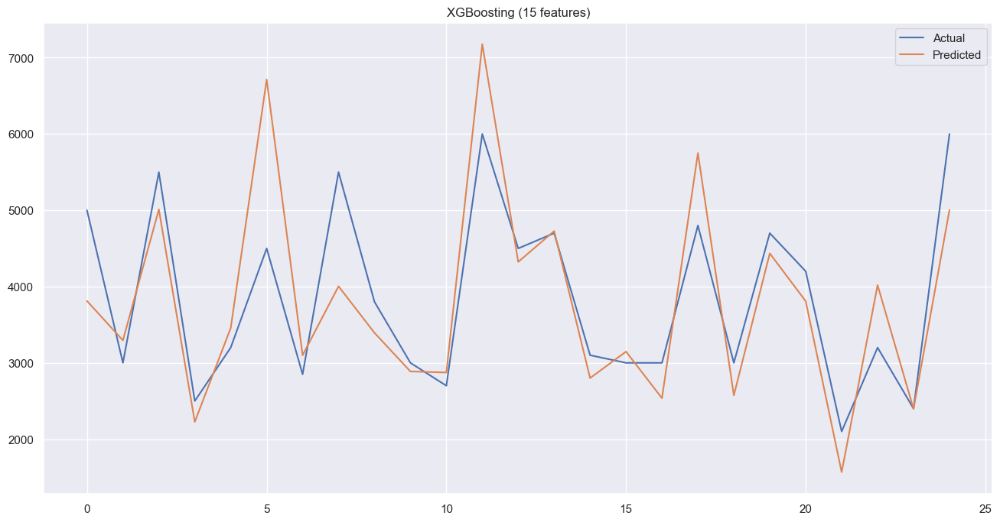

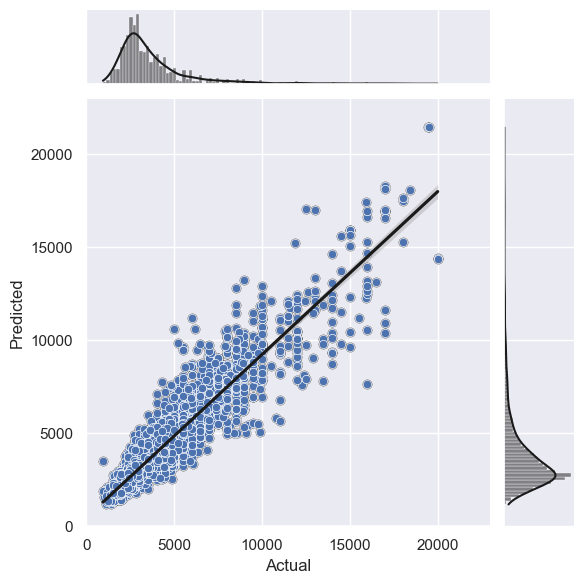

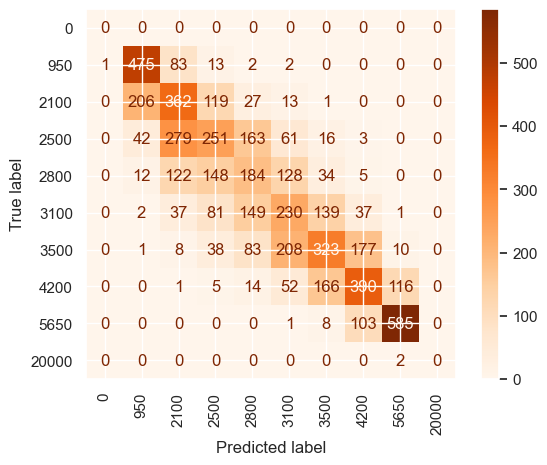

In [22]:
"""
Test reg_xgb_15f
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "XGBoosting (15 features)")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

In [23]:
"""
Fit XGB regressor for every attribute (reg_xgb_7f)
""" 
X_train, X_test, y_train, y_test = train_test_split(X_7f, y, test_size=test_ratio, random_state=rand_val)

reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))

reg_xgb_7f = XGBRegressor(**reg.best_params_)
reg_xgb_7f.fit(X_train, y_train)
y_pred = reg_xgb_7f.predict(X_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 400, 'min_child_weight': 10, 'max_depth': 9, 'learning_rate': 0.05}



R^2: 0.861

RMSLE: 0.029


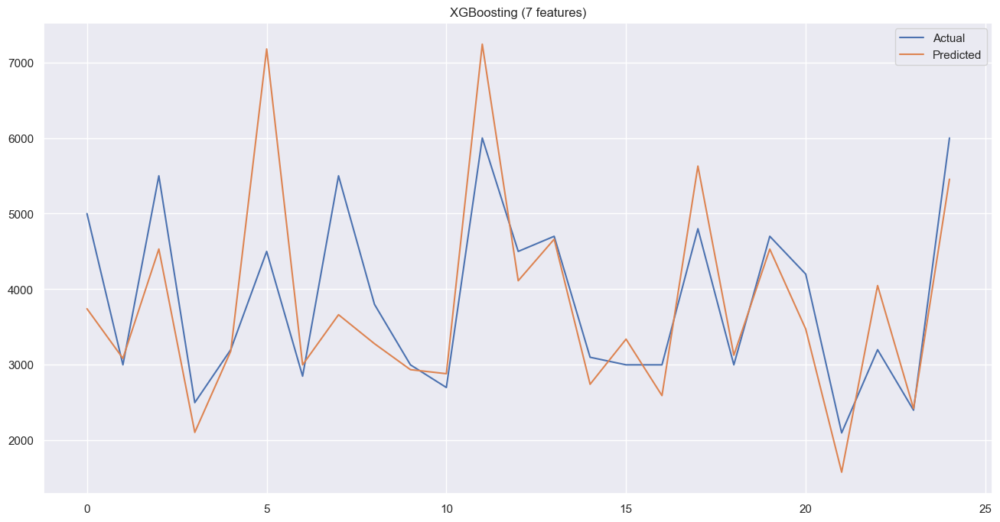

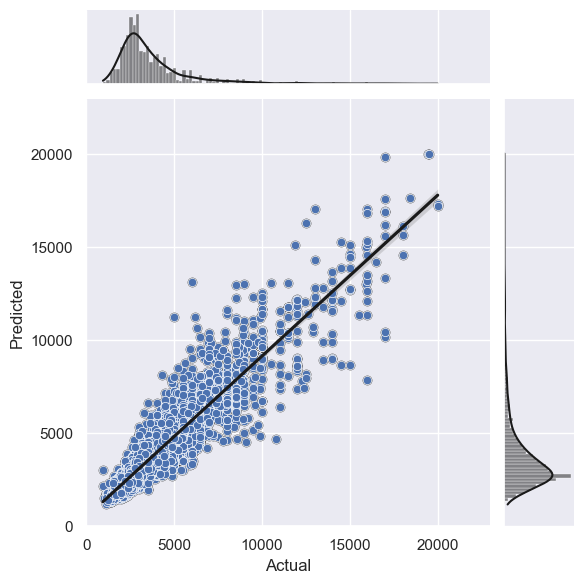

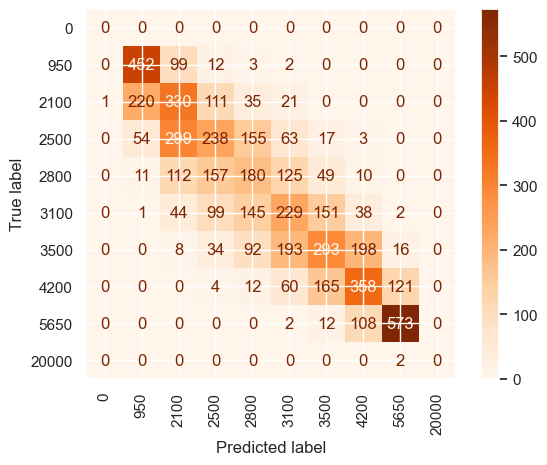

In [24]:
"""
Test reg_xgb_7f
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "XGBoosting (7 features)")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

In [25]:
"""
Fit XGB regressor for every attribute (reg_xgb_4f)
""" 
X_train, X_test, y_train, y_test = train_test_split(X_4f, y, test_size=test_ratio, random_state=rand_val)

reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))

reg_xgb_4f = XGBRegressor(**reg.best_params_)
reg_xgb_4f.fit(X_train, y_train)
y_pred = reg_xgb_4f.predict(X_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 800, 'min_child_weight': 1, 'max_depth': 6, 'learning_rate': 0.1}



R^2: 0.848

RMSLE: 0.032


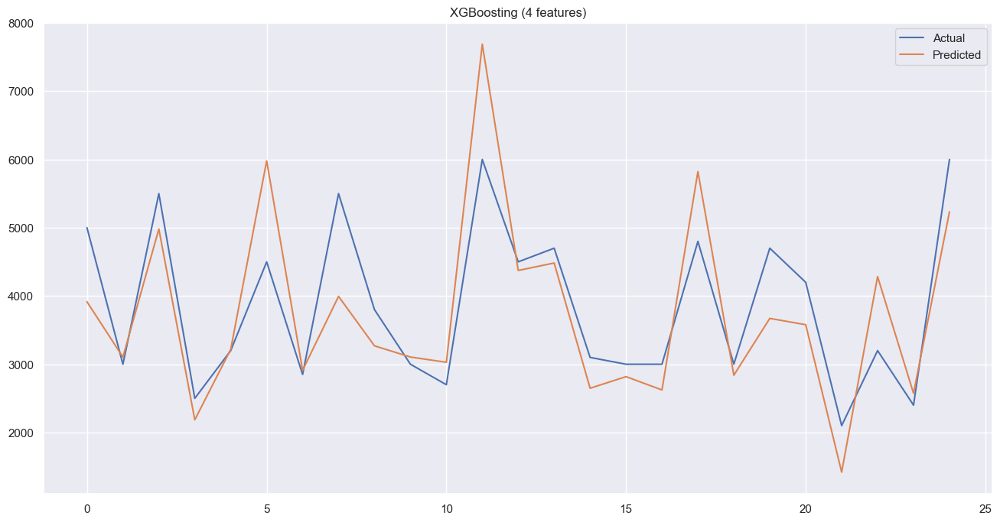

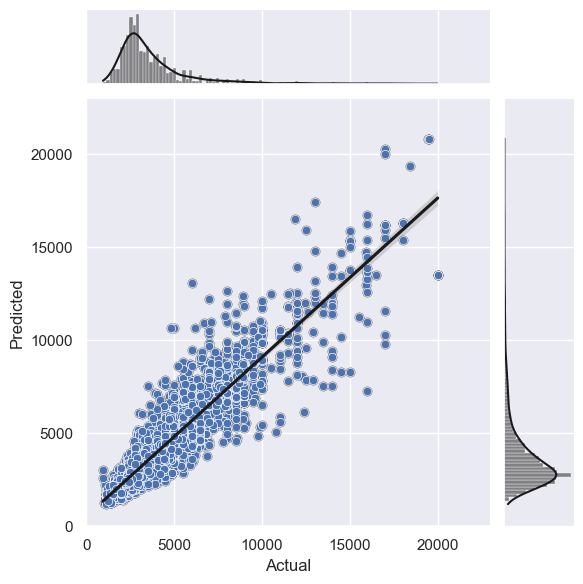

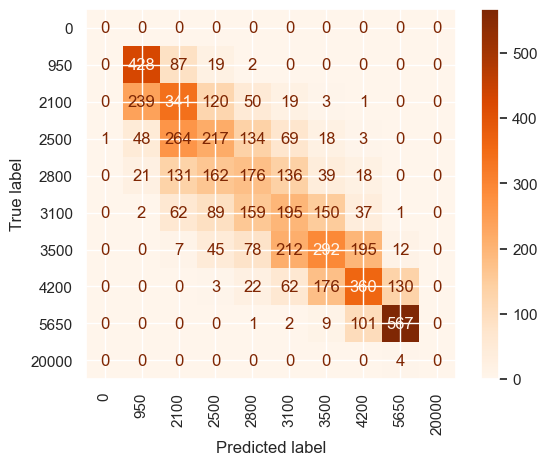

In [26]:
"""
Test reg_xgb_4f
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "XGBoosting (4 features)")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

In [27]:
"""
Fit XGB regressor for every attribute (reg_xgb_flex)
""" 
X_train, X_test, y_train, y_test = train_test_split(X_15f, y, test_size=test_ratio, random_state=rand_val)

reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))

reg_xgb_flex = XGBRegressor(**reg.best_params_)
preprocessing = DataFrameMapper([(X_train.keys(), [SimpleImputer(missing_values=np.nan, strategy='median')])])
pipeline_xgb = PMMLPipeline([("preprocessing", preprocessing), ('regressor', reg_xgb_flex)])

pipeline_xgb.fit(X_train, y_train)
y_pred = pipeline_xgb.predict(X_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 800, 'min_child_weight': 10, 'max_depth': 9, 'learning_rate': 0.05}



R^2: 0.869

RMSLE: 0.027


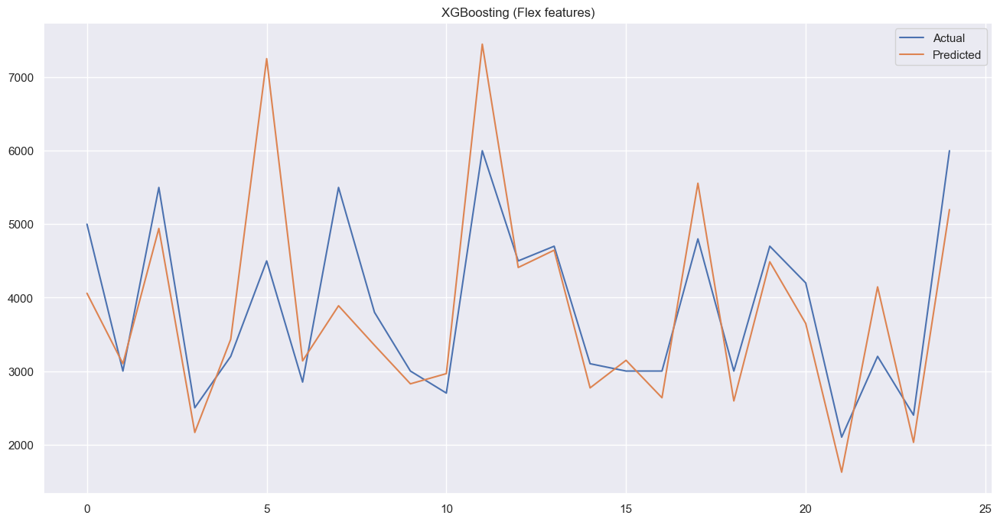

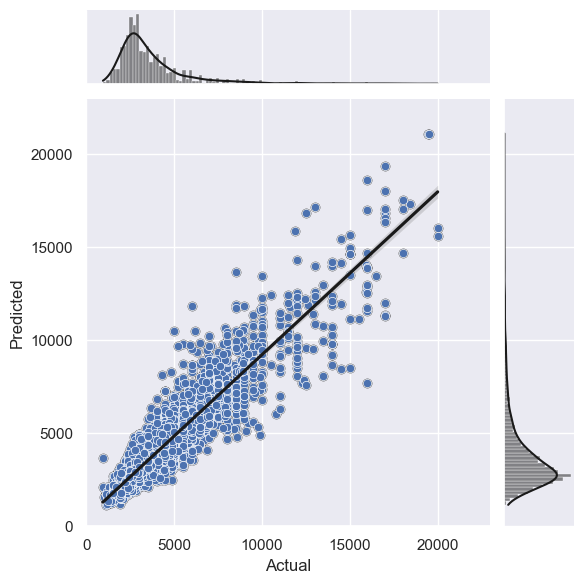

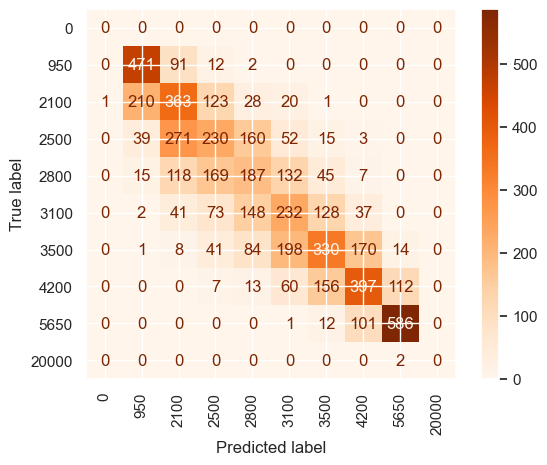

In [28]:
"""
Test reg_xgb_flex
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "XGBoosting (Flex features)")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

### 8. Build best random-forest models

In [29]:
"""
Create cross-validation model for random forest regressor.
"""

"""
Default:
parameters={
    'n_estimators': 100,
    'criterion': 'mse',
    'max_depth': None,
    'min_samples_split': 2,
    'min_samples_leaf': 1,
    'max_features': 'auto',
    'bootstrap': True
}
"""

parameters={
    'max_depth': [None, 5, 10, 15],
    'n_estimators': [10, 25, 50, 100],
    'criterion':['squared_error', 'poisson', 'friedman_mse'],
    'min_samples_split': [2, 4, 8],
    'min_samples_leaf': [1, 2, 3],
    'max_features': [0.5, 0.75, 1.0]
}

rf_reg = RandomForestRegressor()
reg = RandomizedSearchCV(
    estimator=rf_reg,
    param_distributions=parameters,
    cv=5,
    scoring='neg_mean_squared_log_error',
    n_jobs=-1,
    verbose=2
)

In [30]:
"""
Fit random forest regressor for every attribute (reg_rf_15f)
""" 
X_train, X_test, y_train, y_test = train_test_split(X_15f, y, test_size=test_ratio, random_state=rand_val)

reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))

reg_rf_15f = RandomForestRegressor(**reg.best_params_)
reg_rf_15f.fit(X_train, y_train)
y_pred = reg_rf_15f.predict(X_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 25, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.5, 'max_depth': None, 'criterion': 'poisson'}



R^2: 0.860

RMSLE: 0.028


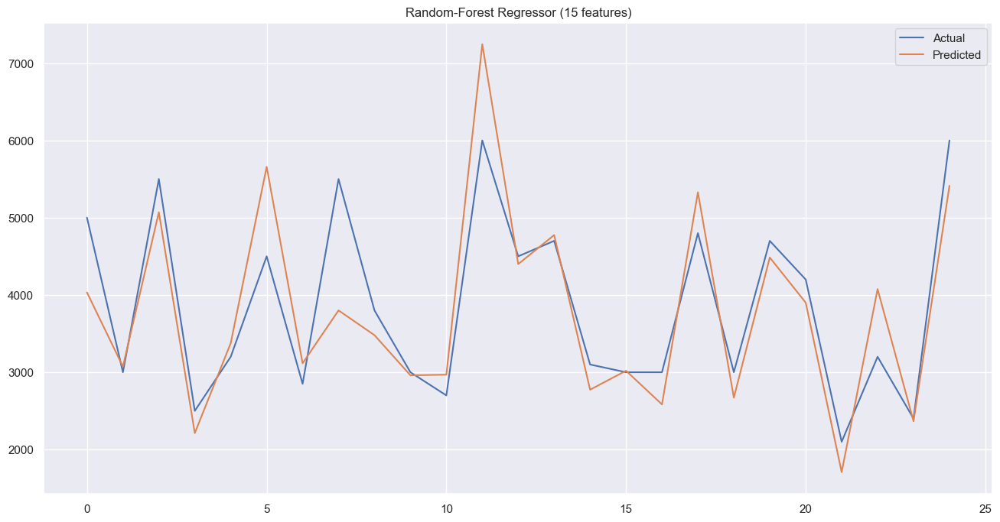

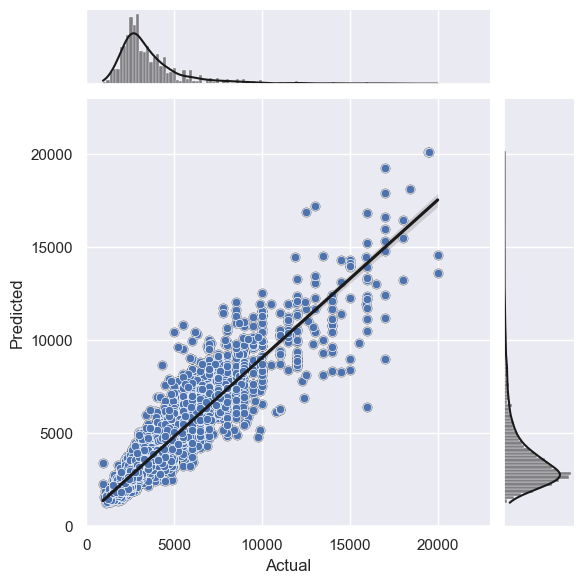

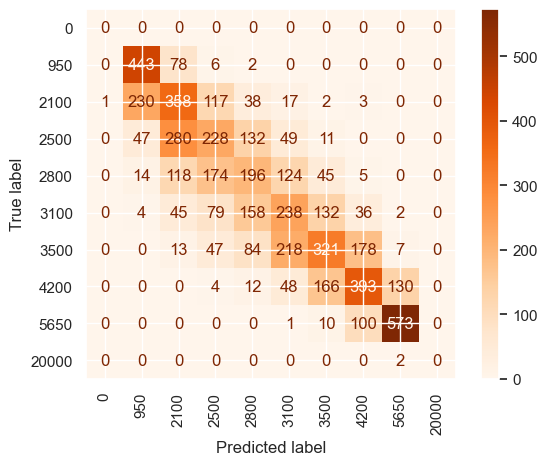

In [31]:
"""
Test reg_rf_15f
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "Random-Forest Regressor (15 features)")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

In [32]:
"""
Fit random forest regressor for 7 features (reg_rf_7f)
""" 
X_train, X_test, y_train, y_test = train_test_split(X_7f, y, test_size=test_ratio, random_state=rand_val)

reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))

reg_rf_7f = RandomForestRegressor(**reg.best_params_)
reg_rf_7f.fit(X_train, y_train)
y_pred = reg_rf_7f.predict(X_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.75, 'max_depth': None, 'criterion': 'squared_error'}



R^2: 0.864

RMSLE: 0.027


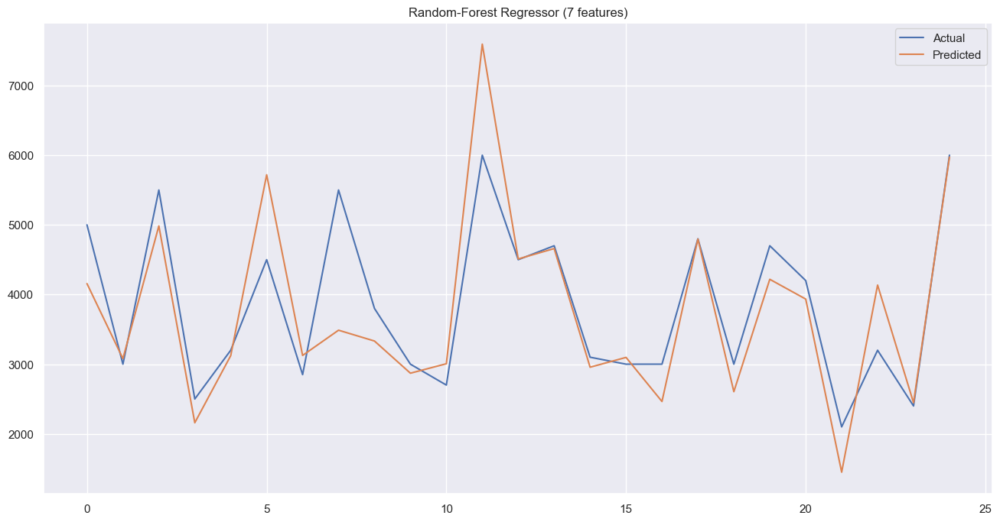

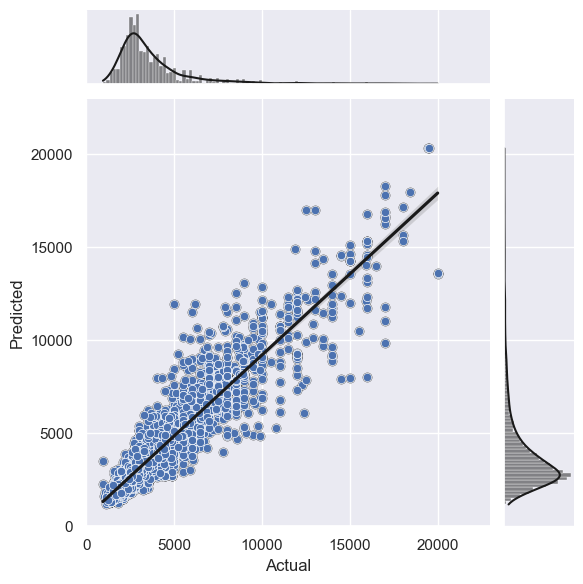

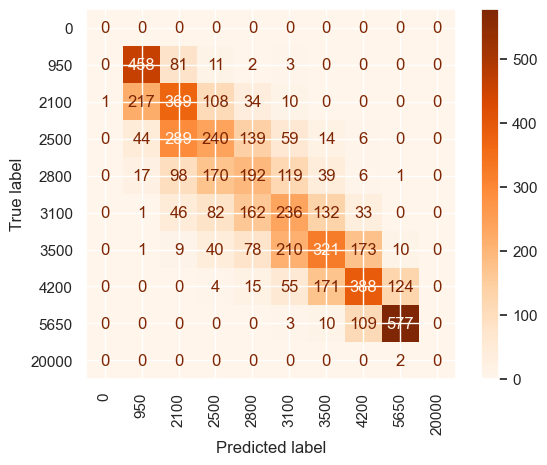

In [33]:
"""
Test reg_rf_7f
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "Random-Forest Regressor (7 features)")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

In [34]:
"""
Fit random forest regressor for 4 features (reg_rf_4f)
""" 
X_train, X_test, y_train, y_test = train_test_split(X_4f, y, test_size=test_ratio, random_state=rand_val)

reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))

reg_rf_4f = RandomForestRegressor(**reg.best_params_)
reg_rf_4f.fit(X_train, y_train)
y_pred = reg_rf_4f.predict(X_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 50, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.75, 'max_depth': None, 'criterion': 'friedman_mse'}



R^2: 0.847

RMSLE: 0.031


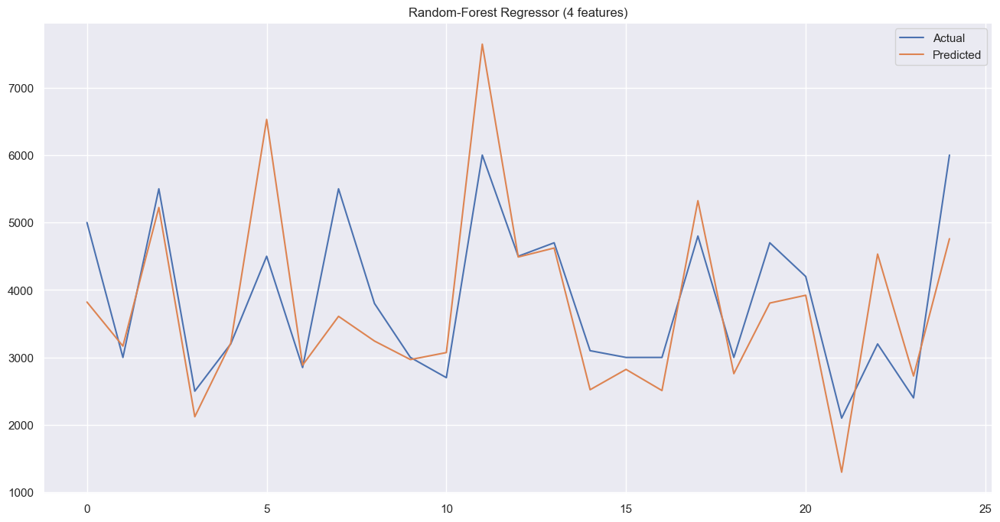

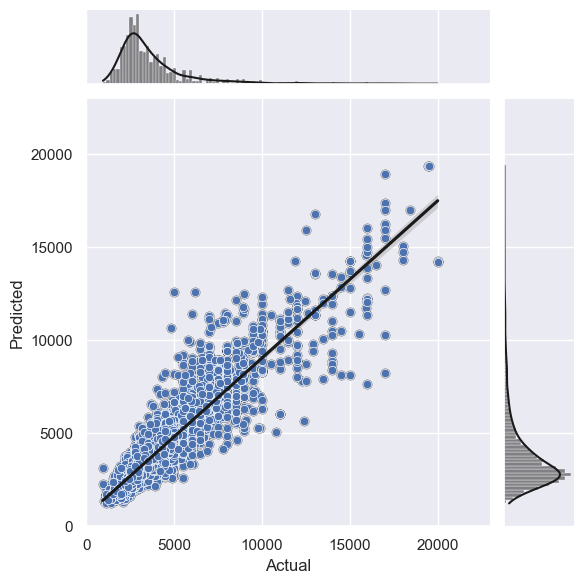

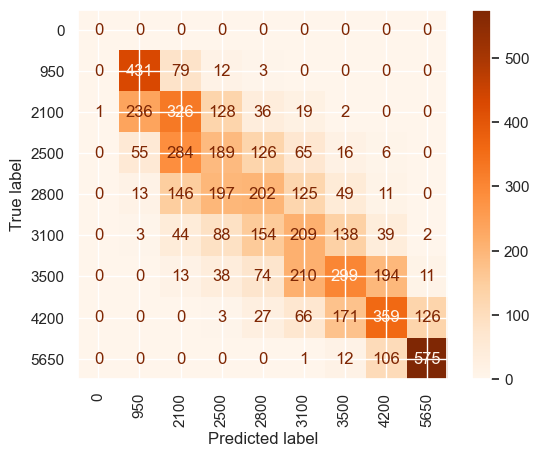

In [35]:
"""
Test reg_rf_4f
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "Random-Forest Regressor (4 features)")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

In [36]:
"""
Fit random forest regressor for every attribute (reg_rf_flex)
"""
X_train, X_test, y_train, y_test = train_test_split(X_15f, y, test_size=test_ratio, random_state=rand_val)

reg.fit(X_train, y_train)
print("Best hiperparameters: " + str(reg.best_params_))

reg_rf_flex = RandomForestRegressor(**reg.best_params_)
preprocessing = DataFrameMapper([(X_train.keys(), [SimpleImputer(missing_values=np.nan, strategy='median')])])
pipeline_rf = PMMLPipeline([("preprocessing", preprocessing), ('regressor', reg_rf_flex)])

pipeline_rf.fit(X_train, y_train)
y_pred = pipeline_rf.predict(X_test)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hiperparameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.75, 'max_depth': 15, 'criterion': 'friedman_mse'}



R^2: 0.857

RMSLE: 0.029


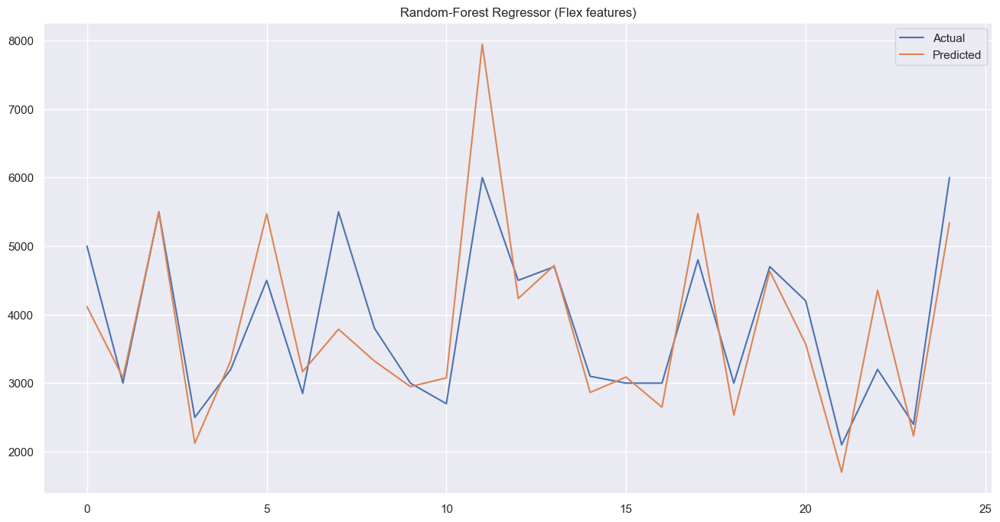

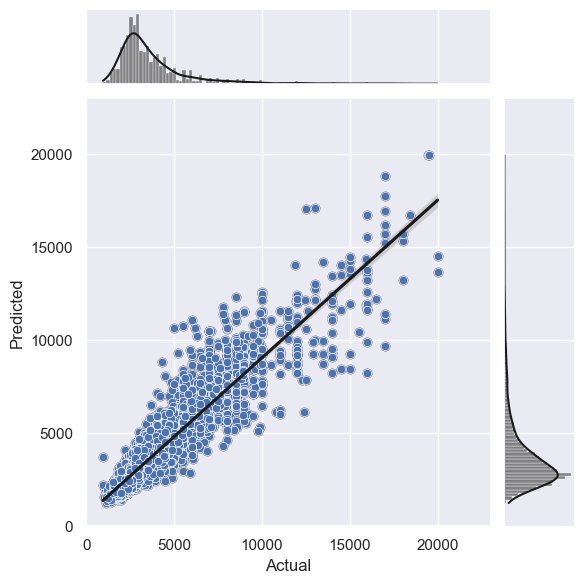

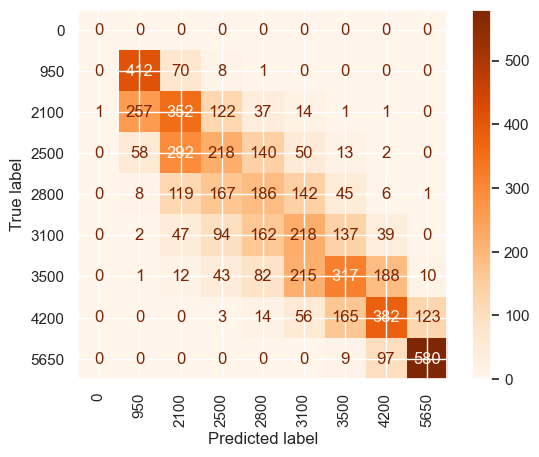

In [37]:
"""
Test reg_rf_flex
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "Random-Forest Regressor (Flex features)")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

### 9. Build and test ensemble models

In [38]:
"""
Fit and test voting flex model
"""
reg_voting_flex = VotingRegressor(estimators=[('rf', pipeline_rf), ('xgb', pipeline_xgb)])
pipeline_voting_flex = PMMLPipeline([('regressor', reg_voting_flex)])
pipeline_voting_flex.fit(X_train, y_train)
y_pred = pipeline_voting_flex.predict(X_test)

C:\Users\dgajd\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn2pmml\pipeline\__init__.py:72: UserWarning: y is missing target field name(s)
  warnings.warn("y is missing target field name(s)")
C:\Users\dgajd\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn2pmml\pipeline\__init__.py:72: UserWarning: y is missing target field name(s)
  warnings.warn("y is missing target field name(s)")



R^2: 0.868

RMSLE: 0.027


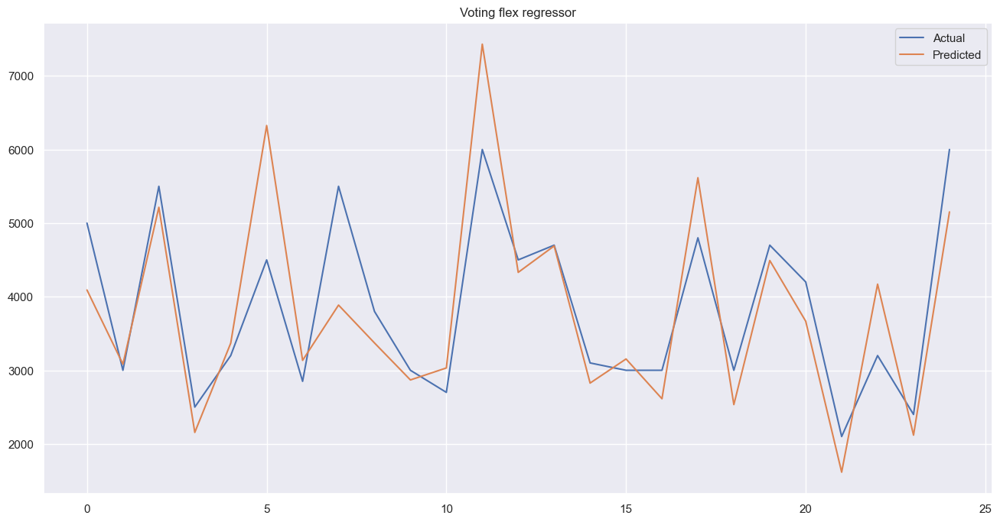

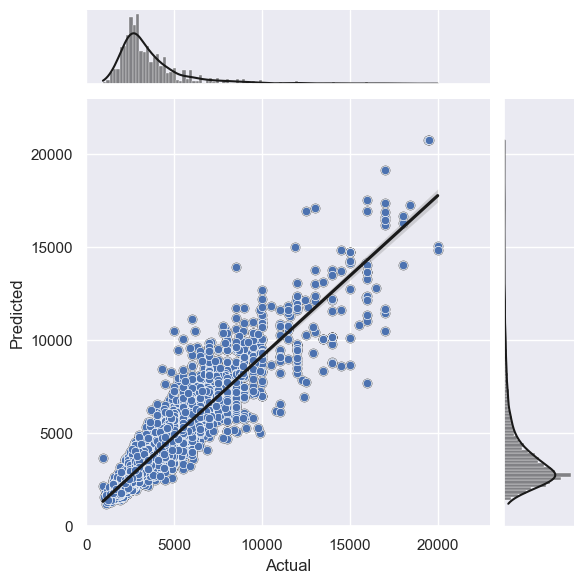

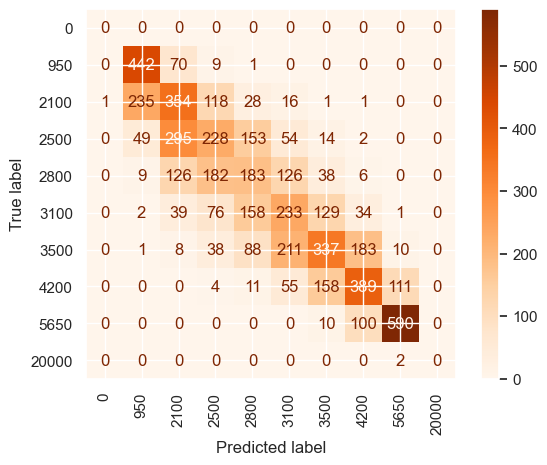

In [39]:
"""
Test voting flex model
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "Voting flex regressor")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

In [40]:
"""
Fit and test voting model for 7 features
"""
reg_voting_7f = VotingRegressor(estimators=[('rf', reg_rf_7f), ('xgb', reg_xgb_7f)])
pipeline_voting_7f = PMMLPipeline([('regressor', reg_voting_7f)])
pipeline_voting_7f.fit(X_train, y_train)
y_pred = pipeline_voting_7f.predict(X_test)


R^2: 0.868

RMSLE: 0.027


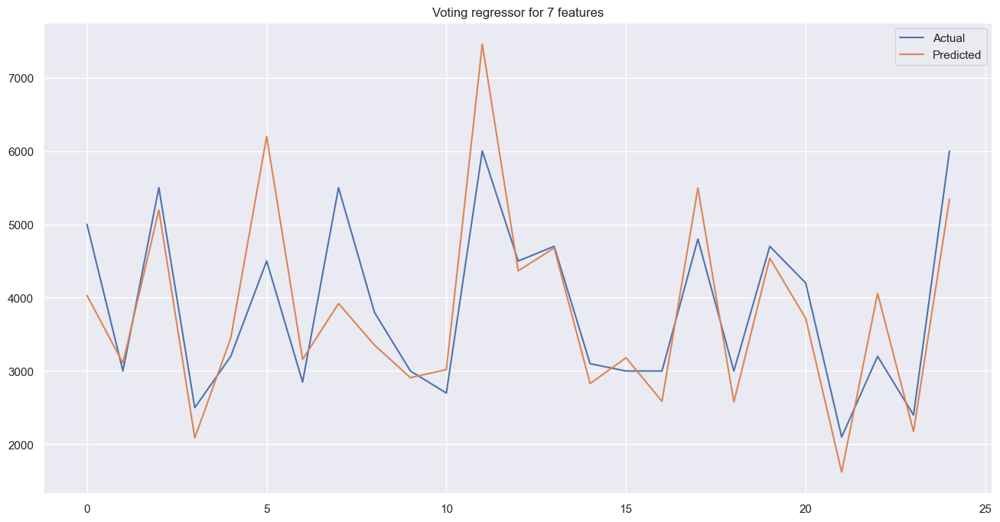

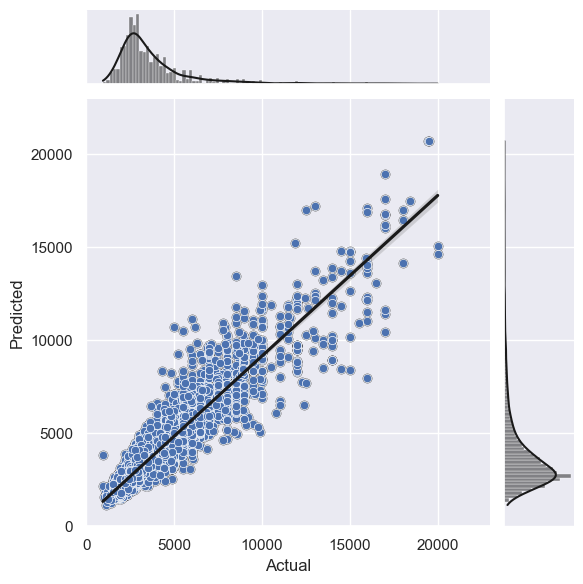

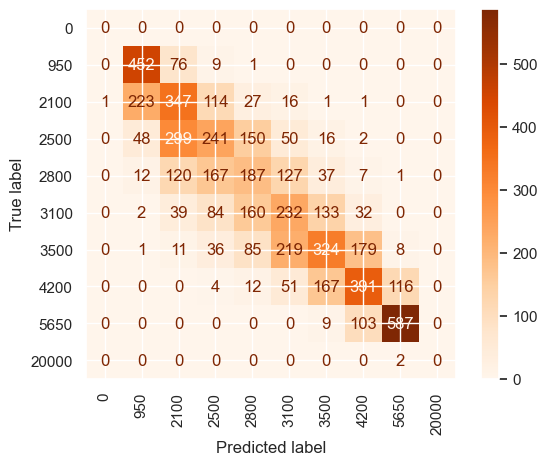

In [41]:
"""
Test voting model for 7 features
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "Voting regressor for 7 features")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

In [42]:
"""
Fit and test voting model for 4 features
"""
reg_voting_4f = VotingRegressor(estimators=[('rf', reg_rf_4f), ('xgb', reg_xgb_4f)])
pipeline_voting_4f = PMMLPipeline([('regressor', reg_voting_4f)])
pipeline_voting_4f.fit(X_train, y_train)
y_pred = pipeline_voting_4f.predict(X_test)


R^2: 0.867

RMSLE: 0.027


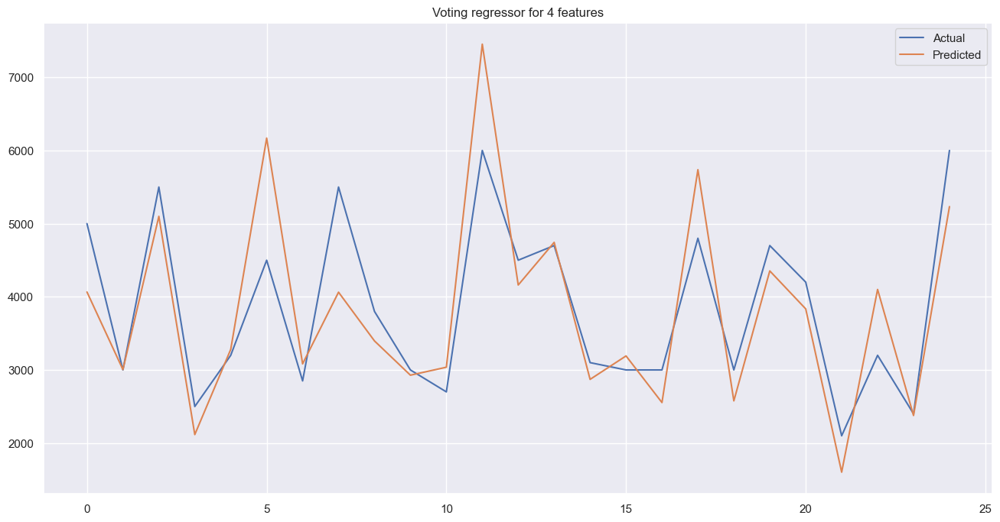

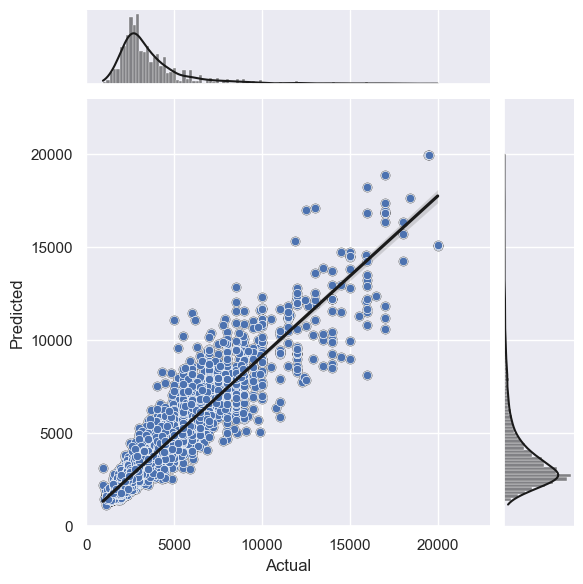

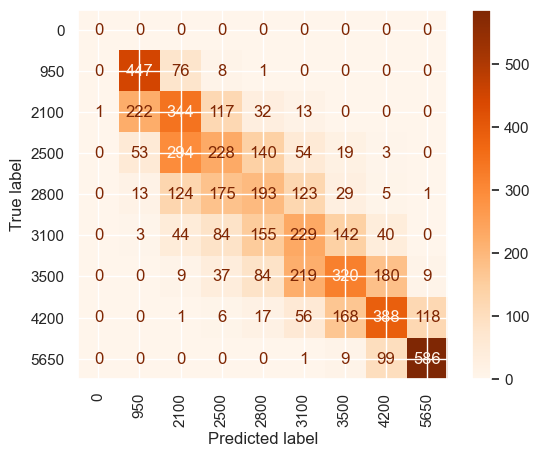

In [43]:
"""
Test voting model for 4 features
"""
print_coefficients(y_pred, y_test)
print_diff_plot(y_pred, y_test, "Voting regressor for 4 features")
print_covergence_plot(y_pred, y_test)
print_accuracy_diagram(y_pred, y_test)

### 10. Tests

In [45]:
X_test_subset = X_test[['latitude', 'longitude', 'floorCount']]
X_test_subset.reset_index(drop=True, inplace=True)
X_test_subset = X_test_subset.loc[0]
print(X_test_subset)


df = pd.DataFrame([X_test_subset], columns=list(X_train.keys()))
test_y = pipeline_voting_flex.predict(df)
print(f"result: {test_y}")

latitude      54.390004
longitude     18.650107
floorCount    12.000000
Name: 0, dtype: float64
result: [2898.65980959]


### 11. Data required for every model

In [46]:
print("Data for 15-features or flex mode")
print(list(X_train.keys()))

print("\nData for 7-features model")
print(columns_7f)

print("\nData for 4-features model")
print(columns_4f)

Data for 15-features or flex mode
['squareMeters', 'rooms', 'floorCount', 'latitude', 'longitude', 'centreDistance', 'poiCount', 'schoolDistance', 'clinicDistance', 'postOfficeDistance', 'kindergartenDistance', 'restaurantDistance', 'collegeDistance', 'pharmacyDistance', 'bialystok', 'bydgoszcz', 'czestochowa', 'gdansk', 'gdynia', 'katowice', 'krakow', 'lodz', 'lublin', 'poznan', 'radom', 'rzeszow', 'szczecin', 'warszawa', 'wroclaw']

Data for 7-features model
['squareMeters', 'rooms', 'floorCount', 'latitude', 'longitude', 'centreDistance', 'bialystok', 'bydgoszcz', 'czestochowa', 'gdansk', 'gdynia', 'katowice', 'krakow', 'lodz', 'lublin', 'poznan', 'radom', 'rzeszow', 'szczecin', 'warszawa', 'wroclaw']

Data for 4-features model
['squareMeters', 'latitude', 'longitude', 'bialystok', 'bydgoszcz', 'czestochowa', 'gdansk', 'gdynia', 'katowice', 'krakow', 'lodz', 'lublin', 'poznan', 'radom', 'rzeszow', 'szczecin', 'warszawa', 'wroclaw']


### 12. Export model to PMML

In [47]:
sklearn2pmml(pipeline_voting_4f, "reg_4f-rent.pmml", with_repr=True)
sklearn2pmml(pipeline_voting_7f, "reg_7f-rent.pmml", with_repr=True)
sklearn2pmml(pipeline_voting_flex, "reg_flex-rent.pmml", with_repr=True)
